In [1]:
import os
import sys
import time
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import numpy as np
from torchsummary import summary
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import torchvision.transforms as tf
import cv2
from PIL import Image

In [2]:
sys.path.append('/openpose')
from model import PoseEstimationWithMobileNet
from include import CocoKeypoints
import transforms

in_len = 360

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"]= "3"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")
model = PoseEstimationWithMobileNet().to(device)
model = nn.DataParallel(model).to(device)
model.load_state_dict(torch.load('best_model_200') )
#                                  map_location=lambda storage, loc: storage))

preprocess = transforms.Compose([
        transforms.Normalize(),
        transforms.RescaleRelative(),
        transforms.Crop(in_len),
        transforms.CenterPad(in_len),
    ])

In [4]:
data_dir = "/var/lib/docker/openpose/coco"
ann_train_dir = [os.path.join(data_dir, 'annotations', item) 
                 for item in ['person_keypoints_train2017.json']]
ann_val_dir = os.path.join(data_dir, 'images/train2017')

image_transform = tf.CenterCrop(in_len)
n_samples = 4
datas = [CocoKeypoints(
            root=ann_val_dir,
            annFile=item,
            preprocess=preprocess,
            image_transform=image_transform,
            target_transforms=image_transform, 
            n_images= n_samples,
            input_x = in_len, 
            input_y = in_len,
        ) for item in ann_train_dir]

loading annotations into memory...
Done (t=10.52s)
creating index...
index created!
filter for keypoint annotations ...
... done.
Images: 4


torch.Size([4, 3, 360, 360])


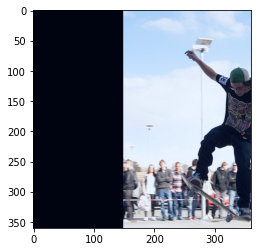

In [15]:
sample_data = torch.utils.data.ConcatDataset(datas)
 
sample_loader = torch.utils.data.DataLoader(
            sample_data, 
            batch_size = 4, 
            shuffle = False,
            num_workers = 4,
            drop_last = True,
            )
(images, target_heatmaps, _), _ = next(iter(sample_loader))
print(images.shape)
stages_output = model(images)
pafs = stages_output[-1]
heatmaps = stages_output[-2]

image = images[0]
heatmap_ = heatmaps[0]
paf_ = pafs[0]
image = image.detach().numpy()
im = np.transpose(image, (1, 2, 0))

max_value = np.max(im)
min_value = np.min(im)
n_im = (im - min_value)/(max_value - min_value)

fig = plt.figure()
plt.imshow(n_im)

In [16]:
# fig = plt.figure(figsize=(50, 24))
# (images, _, _), _ = next(iter(sample_loader))
# for i in range (4):
#     image = images[i]

#     image = image.detach().numpy()
#     im = np.transpose(image, (1, 2, 0))

#     max_value = np.max(im)
#     min_value = np.min(im)
#     im_ = (im - min_value)/(max_value - min_value)
#     plt.subplot(4, 8, i+1)
#     plt.imshow(im_)

In [19]:
criterion = nn.MSELoss().to(device)
target_heatmaps = target_heatmaps.to(device)
heatmaps = heatmaps.to(device)

n_heatmap = (heatmaps - torch.min(heatmaps))/ (torch.max(heatmaps - torch.min(heatmaps)))
for j in range(14):
    loss = criterion(target_heatmaps[0][j], n_heatmap[0][j])
#     print(loss)

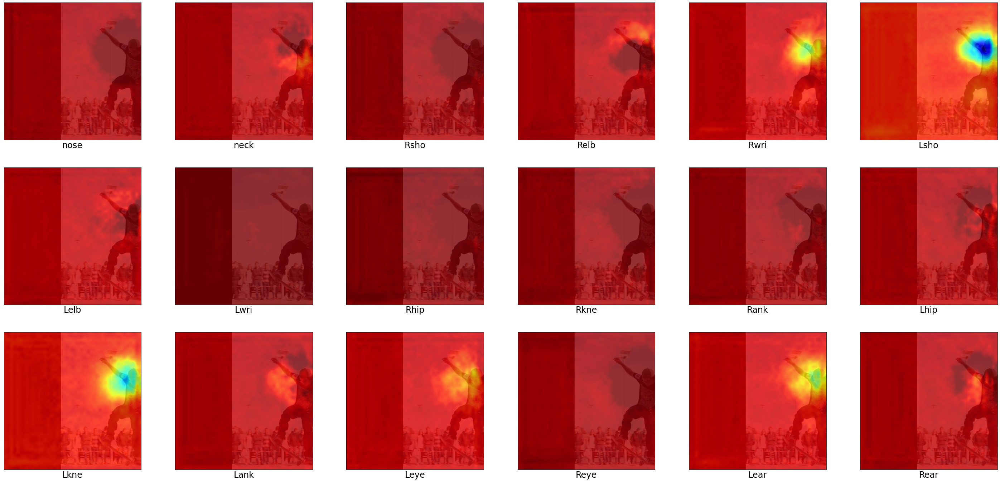

In [20]:
with torch.no_grad():
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    device = torch.device("cpu")
    heatmap = heatmap_.to(device)
#     heatmap = heatmap.detach()
    heatmap = heatmap.numpy()
    heatmap = np.transpose(heatmap, (1, 2, 0))
    heatmap = cv2.resize(heatmap, (0, 0), fx=8, fy=8, interpolation=cv2.INTER_CUBIC)
    im_pil = Image.fromarray((n_im* 255).astype(np.uint8))
    im_pil = im_pil.convert('RGB')

max_value = np.max(heatmap)
min_value = np.min(heatmap)
fig = plt.figure(figsize = (50, 24))
label = ['nose', 'neck', 'Rsho', 'Relb', 'Rwri', 'Lsho', 'Lelb', 'Lwri', 'Rhip', 
         'Rkne', 'Rank', 'Lhip', 'Lkne', 'Lank', 'Leye', 'Reye', 'Lear', 'Rear', 'pt19'] 
for i in range(18):
    vis_img = (heatmap[:, :, i]-min_value)/max_value
    vis_img = Image.fromarray(np.uint8(cm.jet(vis_img) * 255))
    vis_img = vis_img.convert('RGB') 
    vis_img = Image.blend(im_pil, vis_img, 0.8)
    plt.subplot(3,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(vis_img)
    plt.xlabel(label[i], fontsize=24)

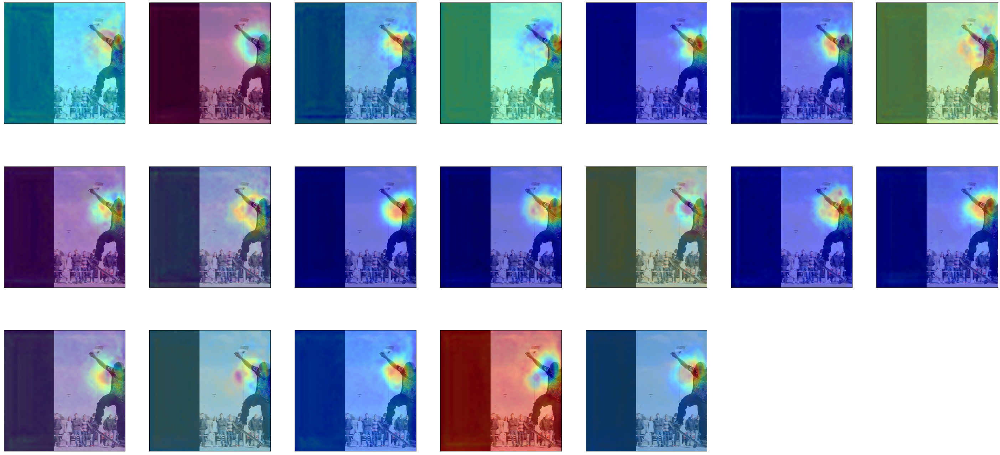

In [9]:
paf = paf_.to(device)
paf = paf.detach().numpy()
paf = np.transpose(paf, (1, 2, 0))
paf = cv2.resize(paf, (0, 0), fx=8, fy=8, interpolation=cv2.INTER_CUBIC)

fig = plt.figure(figsize = (50, 24))
max_value = np.max(paf)
min_value = np.min(paf)
for i in range(19):
    vis_img_x = (paf[:, :, i*2]-min_value)/max_value /255
    vis_img_y = (paf[:, :, i*2+1]-min_value)/max_value /255   
    plt.subplot(3,7,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(n_im, interpolation='nearest')
    plt.imshow(vis_img_x, cmap=plt.cm.jet, alpha=0.3)
    plt.imshow(vis_img_y, cmap=plt.cm.jet, alpha=0.3)

## Sample data
* load data and transform to appropriate type

In [10]:
with open('ski.jpg', 'rb') as f:
    image = Image.open(f).convert('RGB')

# preprocess

## rescalerelative 
w, h =image.size
image = image.resize((int(w * 0.5), int(h * 0.5)), Image.BICUBIC)                
## crop
w, h = image.size
padding = int(in_len/ 2.0)
x_offset, y_offset = 0, 0
if w > in_len:
    x_offset = torch.randint(-padding, w - in_len + padding, (1,))
    x_offset = torch.clamp(x_offset, min=0, max=w - in_len).item()
if h > in_len:
    y_offset = torch.randint(-padding, h - in_len + padding, (1,))
    y_offset = torch.clamp(y_offset, min=0, max=h - in_len).item()
new_w = min(in_len, w - x_offset)
new_h = min(in_len, h - y_offset)
ltrb = (x_offset, y_offset, x_offset + new_w, y_offset + new_h)
image = image.crop(ltrb)
                     
## centerpad
w, h = image.size
left = int((in_len - w) / 2.0)
top = int((in_len - h) / 2.0)
ltrb = (
    left,
    top,
    in_len - w - left,
    in_len - h - top,
)
image = tf.functional.pad(
    image, ltrb, fill=(124, 116, 104))
# tensor, normalize
normalize = tf.Normalize(  # pylint: disable=invalid-name
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)
trans = tf.Compose([
    tf.ToTensor(),
    normalize,
    tf.Resize(in_len)
])
p_image = trans(image)
# print(image.shape)
# print(type(image))

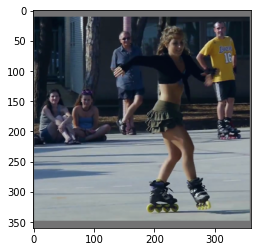

In [11]:
image = torch.reshape(p_image, (1, 3, in_len, in_len))
stages_output = model(image)
pafs = stages_output[-1]
heatmaps = stages_output[-2]

image = image[0]
paf = pafs[0]
heatmap_ = heatmaps[0]

image = image.detach().numpy()
im = np.transpose(image, (1, 2, 0))

max_value = np.max(im)
min_value = np.min(im)
n_im = (im - min_value)/(max_value - min_value)


fig = plt.figure()
plt.imshow(n_im)

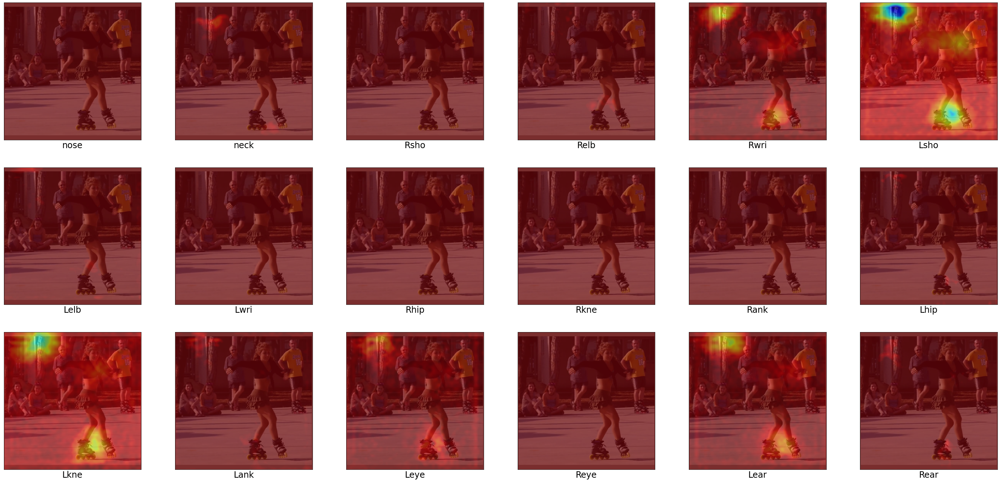

In [12]:
with torch.no_grad():
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    device = torch.device("cpu")
    heatmap = heatmap_.to(device)
    heatmap = heatmap.detach()
    heatmap = heatmap.numpy()
    heatmap = np.transpose(heatmap, (1, 2, 0))
    heatmap = cv2.resize(heatmap, (0, 0), fx=8, fy=8, interpolation=cv2.INTER_CUBIC)
    im_pil = Image.fromarray((n_im* 255).astype(np.uint8))
    im_pil = im_pil.convert('RGB')

max_value = np.max(heatmap)
min_value = np.min(heatmap)
fig = plt.figure(figsize = (50, 24))
label = ['nose', 'neck', 'Rsho', 'Relb', 'Rwri', 'Lsho', 'Lelb', 'Lwri', 'Rhip', 
         'Rkne', 'Rank', 'Lhip', 'Lkne', 'Lank', 'Leye', 'Reye', 'Lear', 'Rear', 'pt19'] 
for i in range(18):
    vis_img = (heatmap[:, :, i]-min_value)/max_value
    vis_img = Image.fromarray(np.uint8(cm.jet(vis_img) * 255))
    vis_img = vis_img.convert('RGB') 
    vis_img = Image.blend(im_pil, vis_img, 0.6)
    plt.subplot(3,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(vis_img)
    plt.xlabel(label[i], fontsize=24)

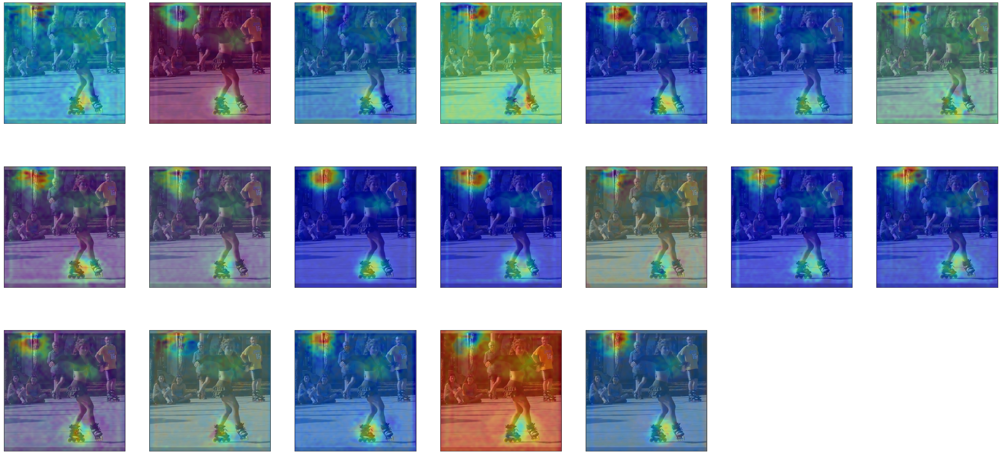

In [13]:
paf = paf.to(device)
paf = paf.detach().numpy()
paf = np.transpose(paf, (1, 2, 0))
paf = cv2.resize(paf, (0, 0), fx=8, fy=8, interpolation=cv2.INTER_CUBIC)

fig = plt.figure(figsize = (50, 24))
max_value = np.max(paf)
min_value = np.min(paf)
for i in range(19):
    vis_img_x = (paf[:, :, i*2]-min_value)/max_value 
    vis_img_y = (paf[:, :, i*2+1]-min_value)/max_value    
    plt.subplot(3,7,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(n_im, interpolation='nearest')
    plt.imshow(vis_img_x, cmap=plt.cm.jet, alpha=0.3)
    plt.imshow(vis_img_y, cmap=plt.cm.jet, alpha=0.3)